In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/baggage-xray-threats/Augmented_Dataset/Sixray/images/P05987rotated45.jpg
/kaggle/input/baggage-xray-threats/Augmented_Dataset/Sixray/images/P02077rotated360.jpg
/kaggle/input/baggage-xray-threats/Augmented_Dataset/Sixray/images/P07827rotated270.jpg
/kaggle/input/baggage-xray-threats/Augmented_Dataset/Sixray/images/P00640flip1.jpg
/kaggle/input/baggage-xray-threats/Augmented_Dataset/Sixray/images/P04183shifted10_0.jpg
/kaggle/input/baggage-xray-threats/Augmented_Dataset/Sixray/images/P04551rotated90.jpg
/kaggle/input/baggage-xray-threats/Augmented_Dataset/Sixray/images/P07631flip1.jpg
/kaggle/input/baggage-xray-threats/Augmented_Dataset/Sixray/images/P04753flip0.jpg
/kaggle/input/baggage-xray-threats/Augmented_Dataset/Sixray/images/P04997rotated45.jpg
/kaggle/input/baggage-xray-threats/Augmented_Dataset/Sixray/images/P07513shifted0_-10.jpg
/kaggle/input/baggage-xray-threats/Augmented_Dataset/Sixray/images/P06278rotated360.jpg
/kaggle/input/baggage-xray-threats/Augmented_Da

In [2]:
import torch
print("pytorch version: ", torch.__version__)
print("cuda availaibility: ", torch.cuda.is_available)

pytorch version:  2.5.1+cu121
cuda availaibility:  <function is_available at 0x7e2537320700>


In [3]:
print(torch.version.cuda)

12.1


In [4]:
!pip install torch torchvision
!pip install albumentations
!pip install pretrainedmodels


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60944 sha256=475a3f37427552cf669d8343f4e16a28542f606c7491007ca2983323798a1d5b
  Stored in directory: /root/.cache/pip/wheels/35/cb/a5/8f534c60142835bfc889f9a482e4a67e0b817032d9c6883b64
Successfully built pretrainedmodels


In [10]:
# since I have X-ray images without labels, lets apply a pretrained YOLOv5 model (likely fine-tuned on SIXray or similar) for inference only — not training.


import shutil
import os

os.makedirs('data/images', exist_ok=True)
shutil.copy('/kaggle/input/baggage-xray-threats/Augmented_Dataset/Sixray/images/P00001flip-1.jpg', 'data/images/image1.jpg')
# shutil.copy('/kaggle/input/baggage-xray-threats/Augmented_Dataset/GDXray/images/B0001_0001flip-1.jpg', 'data/images/image1.jpg')

'data/images/image1.jpg'

In [6]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17306, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 17306 (delta 17), reused 7 (delta 6), pack-reused 17281 (from 4)
Receiving objects: 100% (17306/17306), 16.16 MiB | 29.45 MiB/s, done.
Resolving deltas: 100% (11878/11878), done.
/kaggle/working/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 17.9 MB/s eta 0:00:00a 0:00:01


In [11]:
# detect on pretrained model
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/image1.jpg --save-txt --save-conf

detect: weights=['yolov5s.pt'], source=data/images/image1.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-405-g61c22e2d Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
image 1/1 /kaggle/working/yolov5/data/images/image1.jpg: 480x640 (no detections), 31.3ms
Speed: 0.6ms pre-process, 31.3ms inference, 49.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp4
0 labels saved to runs/detect/exp4/labels


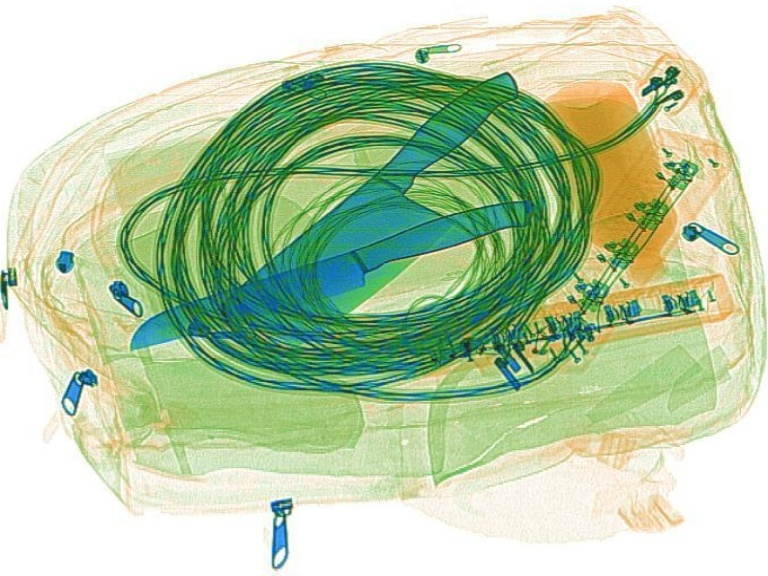

In [13]:
from IPython.display import Image, display
display(Image(filename='runs/detect/exp4/image1.jpg'))

In [29]:
"""As we are lack in actual labeled dataset for weapon or screening threat images,
we will build dummy dataset using stable diffusion model and train the yolo model on 
that dataset an we will see the outcode by predicting on above available dataset"""



txt = "An X-ray image of a luggage bag containing a knife, scissors, gun or any threat weapon"



In [15]:
import os
import random
import torch
from diffusers import StableDiffusionPipeline
from PIL import Image
import cv2

In [16]:
# Load Stable Diffusion
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    use_safetensors=True
).to("cuda")

# Classes and prompts
classes = ['knife', 'scissors', 'gun']
save_dir = "synthetic_dataset"
os.makedirs(f"{save_dir}/images/train", exist_ok=True)
os.makedirs(f"{save_dir}/labels/train", exist_ok=True)

# Generate synthetic images
def generate_image(idx):
    obj = random.choice(classes)
    prompt = f"An X-ray image of a backpack with a {obj}"
    image = pipe(prompt, num_inference_steps=30, guidance_scale=7.5).images[0]
    
    # Save image
    image_path = f"{save_dir}/images/train/img_{idx}.jpg"
    image.save(image_path)

    # Dummy bounding box in center (simulate known location)
    w, h = image.size
    box_w, box_h = 0.3, 0.3  # YOLO format (relative size)
    # to randomize the center:
    # x_center = round(random.uniform(0.3, 0.7), 4)
    # y_center = round(random.uniform(0.3, 0.7), 4)
    
    x_center, y_center = 0.5, 0.5
"""
As we are creating a bounding box as hard coded and fixed in frame, which is not an good idea, this reduces the perfrormance of the model as well
"""



    
    # Write YOLO label
    class_id = classes.index(obj)
    label_path = f"{save_dir}/labels/train/img_{idx}.txt"
    with open(label_path, "w") as f:
        f.write(f"{class_id} {x_center} {y_center} {box_w} {box_h}\n")

# Generate 200 images
for i in range(200):
    generate_image(i)

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

In [17]:
#writing yaml file for yolo model
yaml_content = """
train: synthetic_dataset/images/train
val: synthetic_dataset/images/train

nc: 3
names: ['knife', 'scissors', 'gun']
"""

with open("synthetic_dataset/data.yaml", "w") as f:
    f.write(yaml_content)


In [39]:
#copy and save the dummy created dataset 
!cp -r synthetic_dataset/ /kaggle/working

In [19]:
# train using Yolo v5 
# If using YOLOv5
!python train.py --img 640 --batch 16 --epochs 30 --data synthetic_dataset/data.yaml --weights yolov5s.pt


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-03-25 12:06:28.554829: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-25 12:06:28.583492: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-25 12:06:28.591820: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visua

In [20]:
import shutil

# Save to Kaggle working/output folder
shutil.copy('runs/train/exp2/weights/best.pt', '/kaggle/working/yolov5_synthetic_best.pt')

'/kaggle/working/yolov5_synthetic_best.pt'

In [23]:
!python detect.py --weights /kaggle/working/yolov5_synthetic_best.pt --img 640 --conf 0.25 --source /kaggle/input/baggage-xray-threats/Augmented_Dataset/GDXray/images/B0001_0001flip-1.jpg --save-txt --save-conf

detect: weights=['/kaggle/working/yolov5_synthetic_best.pt'], source=/kaggle/input/baggage-xray-threats/Augmented_Dataset/GDXray/images/B0001_0001flip-1.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-405-g61c22e2d Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /kaggle/input/baggage-xray-threats/Augmented_Dataset/GDXray/images/B0001_0001flip-1.jpg: 480x640 (no detections), 32.2ms
Speed: 0.6ms pre-process, 32.2ms inference, 10.6ms NMS per image at shape (1, 3, 640, 640)
Results saved to

In [24]:
from IPython.display import Image, display
display(Image(filename='runs/detect/exp5//kaggle/input/baggage-xray-threats/Augmented_Dataset/GDXray/images/B0001_0001flip-1.jpg'))

FileNotFoundError: [Errno 2] No such file or directory: 'runs/detect/exp5//kaggle/input/baggage-xray-threats/Augmented_Dataset/GDXray/images/B0001_0001flip-1.jpg'

In [41]:
# !ls synthetic_dataset/images/train
from IPython.display import Image, display
display(Image(filename='/kaggle/working/synthetic_dataset/labels/train/img_1.txt'))

img_0.jpg    img_130.jpg  img_161.jpg  img_192.jpg  img_42.jpg	img_73.jpg
img_100.jpg  img_131.jpg  img_162.jpg  img_193.jpg  img_43.jpg	img_74.jpg
img_101.jpg  img_132.jpg  img_163.jpg  img_194.jpg  img_44.jpg	img_75.jpg
img_102.jpg  img_133.jpg  img_164.jpg  img_195.jpg  img_45.jpg	img_76.jpg
img_103.jpg  img_134.jpg  img_165.jpg  img_196.jpg  img_46.jpg	img_77.jpg
img_104.jpg  img_135.jpg  img_166.jpg  img_197.jpg  img_47.jpg	img_78.jpg
img_105.jpg  img_136.jpg  img_167.jpg  img_198.jpg  img_48.jpg	img_79.jpg
img_106.jpg  img_137.jpg  img_168.jpg  img_199.jpg  img_49.jpg	img_7.jpg
img_107.jpg  img_138.jpg  img_169.jpg  img_19.jpg   img_4.jpg	img_80.jpg
img_108.jpg  img_139.jpg  img_16.jpg   img_1.jpg    img_50.jpg	img_81.jpg
img_109.jpg  img_13.jpg   img_170.jpg  img_20.jpg   img_51.jpg	img_82.jpg
img_10.jpg   img_140.jpg  img_171.jpg  img_21.jpg   img_52.jpg	img_83.jpg
img_110.jpg  img_141.jpg  img_172.jpg  img_22.jpg   img_53.jpg	img_84.jpg
img_111.jpg  img_142.jpg  img_173.jpg  i

ValueError: Cannot embed the 'txt' image format

In [46]:
import pandas as pd
pd.read_csv('/kaggle/working/synthetic_dataset/labels/train/img_1.txt')

,0 0.5 0.5 0.3 0.3


In [ ]:
$